In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds

from tensorflow.keras.utils import plot_model

tfds.disable_progress_bar()
autotune = tf.data.experimental.AUTOTUNE


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=False)

Mounted at /content/drive


In [ ]:
# Load the monet-photo dataset using tensorflow-datasets.
dataset, _ = tfds.load("cycle_gan/monet2photo", with_info=True, as_supervised=True,
                       data_dir="/content/drive/MyDrive/CycleGAN/datasets")
train_monet, train_photo = dataset["trainA"], dataset["trainB"]
test_monet, test_photo = dataset["testA"], dataset["testB"]


In [ ]:
# Define the standard image size.
orig_img_size = (286, 286)
# Size of the random crops to be used during training.
input_img_size = (256, 256, 3)
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1


def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0


def preprocess_train_image(img, label):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [*orig_img_size])
    # Random crop to 256X256
    img = tf.image.random_crop(img, size=[*input_img_size])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img


def preprocess_test_image(img, label):
    # Only resizing and normalization for the test images.
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img


In [ ]:
# Apply the preprocessing operations to the training data
train_monet = (
    train_monet.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
train_photo = (
    train_photo.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

# Apply the preprocessing operations to the test data
test_monet = (
    test_monet.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
test_photo = (
    test_photo.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)


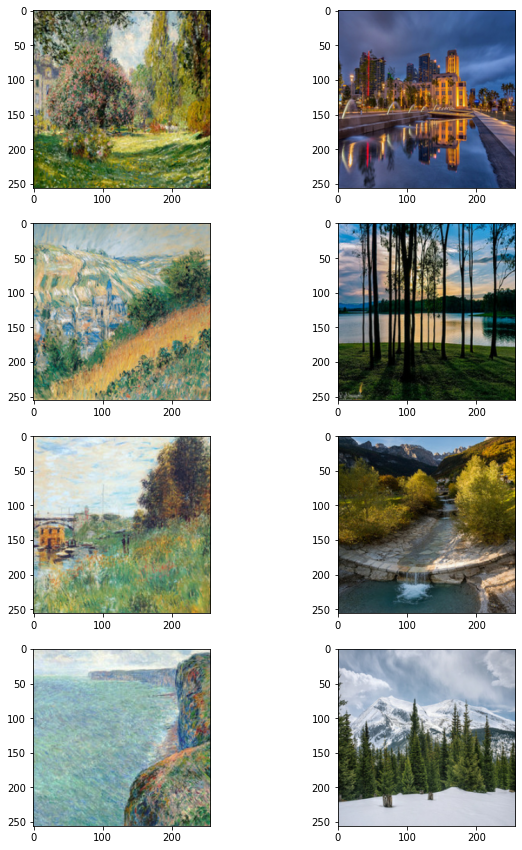

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(train_monet.take(4), train_photo.take(4))):
    monet = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    photo = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(monet)
    ax[i, 1].imshow(photo)
plt.show()


In [ ]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model


In [ ]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")


In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super(CycleGan, self).__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super(CycleGan, self).compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    we can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adverserial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adverserial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }


In [ ]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_photo.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.preprocessing.image.array_to_img(prediction)
            prediction.save(
                "/content/drive/MyDrive/CycleGAN/photo/generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()


In [ ]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y, lambda_cycle=5
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=4e-3, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=4e-3, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=4e-3, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=4e-3, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "/content/drive/MyDrive/CycleGAN/pre-trained/cyclegan_monet2photo_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
)


Epoch 1/20
1072/1072 [==============================] - 712s 613ms/step - G_loss: 2.6110 - F_loss: 2.3954 - D_X_loss: 0.2418 - D_Y_loss: 0.2264


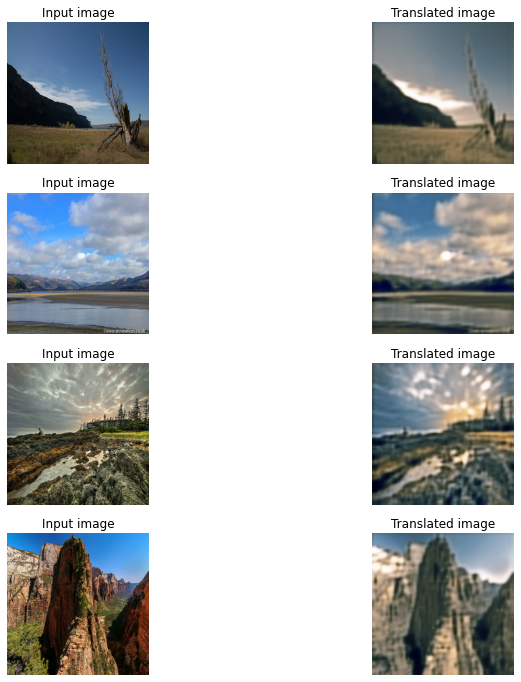

Epoch 2/20
1072/1072 [==============================] - 660s 615ms/step - G_loss: 2.1364 - F_loss: 2.0396 - D_X_loss: 0.2434 - D_Y_loss: 0.2366


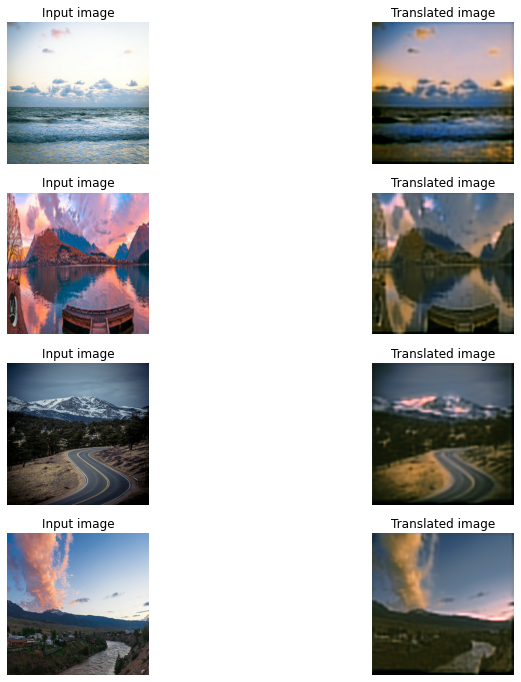

Epoch 3/20
1072/1072 [==============================] - 658s 614ms/step - G_loss: 2.0417 - F_loss: 2.0981 - D_X_loss: 0.4521 - D_Y_loss: 0.2312


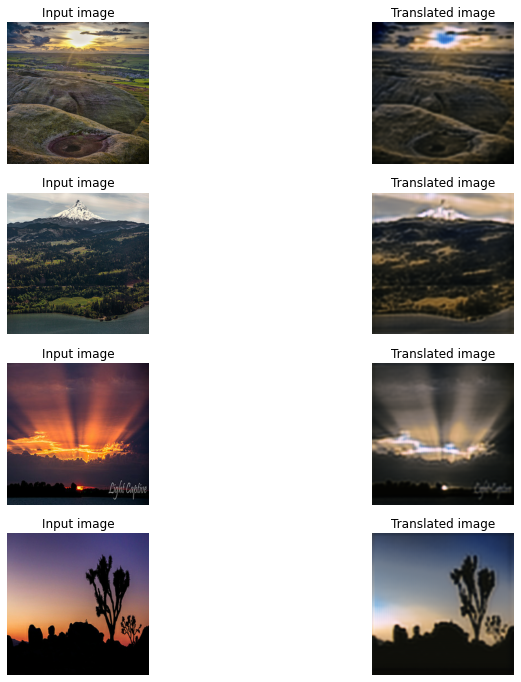

Epoch 4/20
1072/1072 [==============================] - 658s 613ms/step - G_loss: 1.9588 - F_loss: 1.7884 - D_X_loss: 0.2459 - D_Y_loss: 0.2225


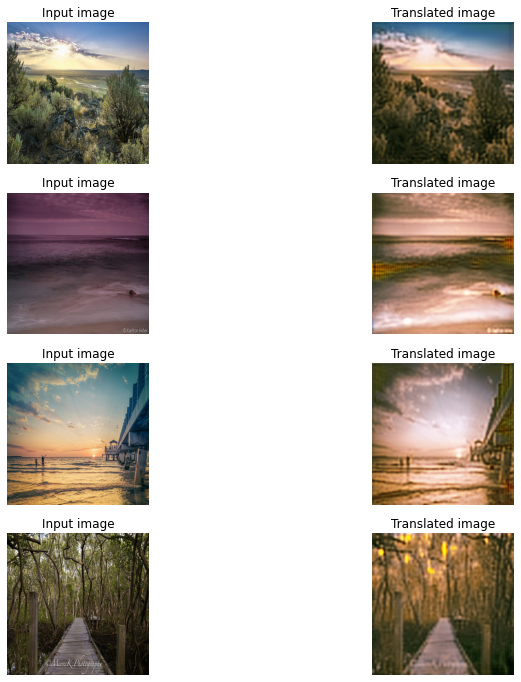

Epoch 5/20
1072/1072 [==============================] - 658s 613ms/step - G_loss: 1.9218 - F_loss: 1.7764 - D_X_loss: 0.2456 - D_Y_loss: 0.2232


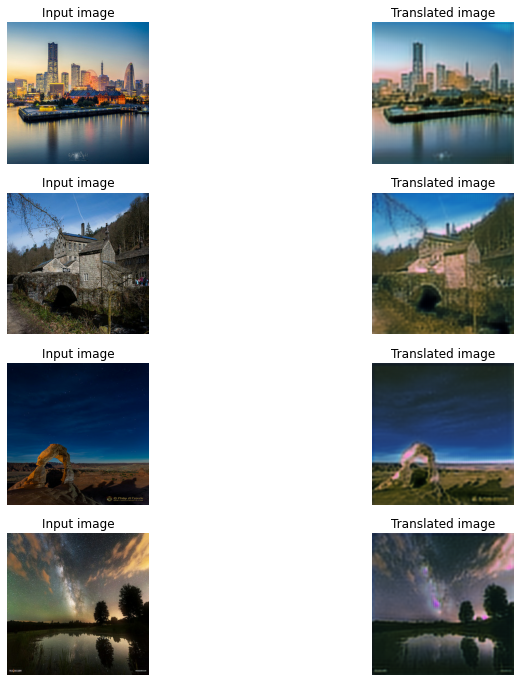

Epoch 6/20
1072/1072 [==============================] - 657s 612ms/step - G_loss: 1.8163 - F_loss: 1.7533 - D_X_loss: 0.2425 - D_Y_loss: 0.2320


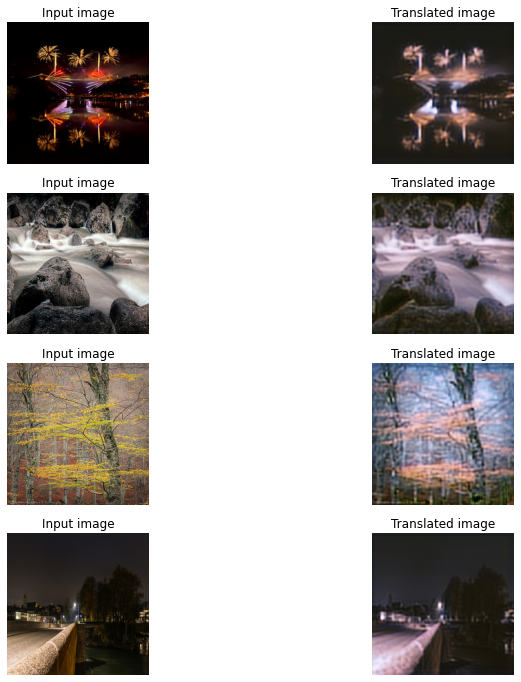

Epoch 7/20
1072/1072 [==============================] - 656s 612ms/step - G_loss: 1.7776 - F_loss: 1.7401 - D_X_loss: 0.2423 - D_Y_loss: 0.2367


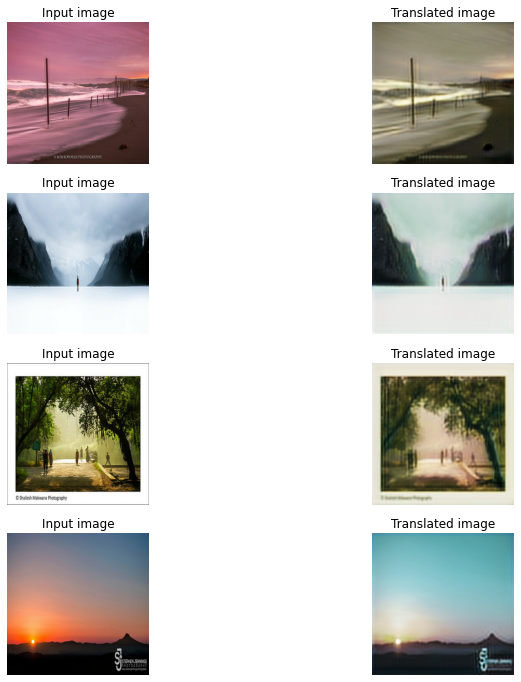

Epoch 8/20
1072/1072 [==============================] - 655s 611ms/step - G_loss: 1.7671 - F_loss: 1.7175 - D_X_loss: 0.2406 - D_Y_loss: 0.2282


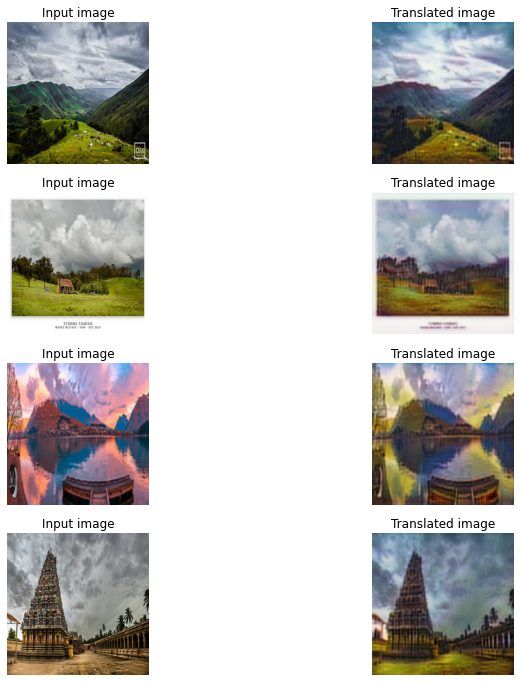

Epoch 9/20
1072/1072 [==============================] - 655s 611ms/step - G_loss: 1.7302 - F_loss: 1.7018 - D_X_loss: 0.2388 - D_Y_loss: 0.2295


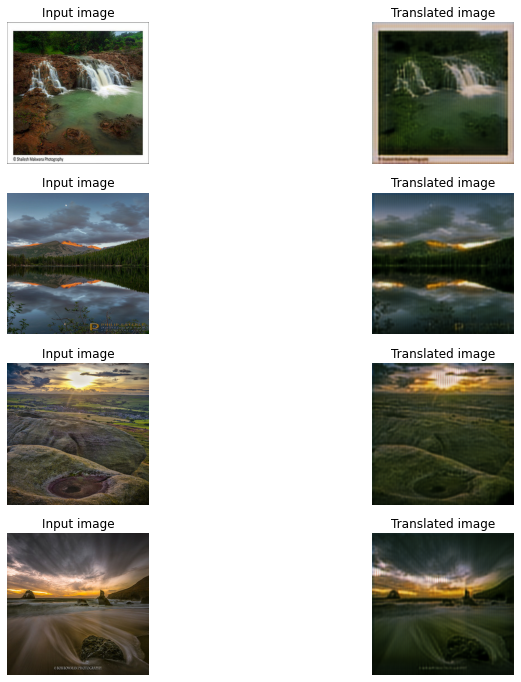

Epoch 10/20
1072/1072 [==============================] - 655s 610ms/step - G_loss: 1.7189 - F_loss: 1.6817 - D_X_loss: 0.2391 - D_Y_loss: 0.2294


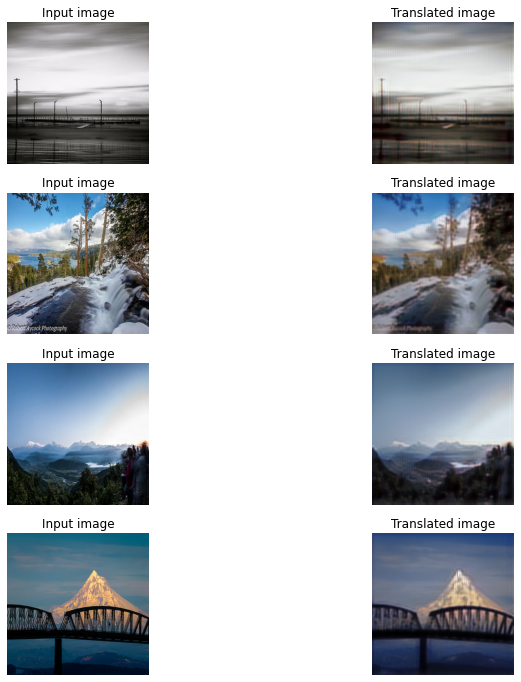

Epoch 11/20
1072/1072 [==============================] - 654s 610ms/step - G_loss: 1.7490 - F_loss: 1.6693 - D_X_loss: 0.2404 - D_Y_loss: 0.2550


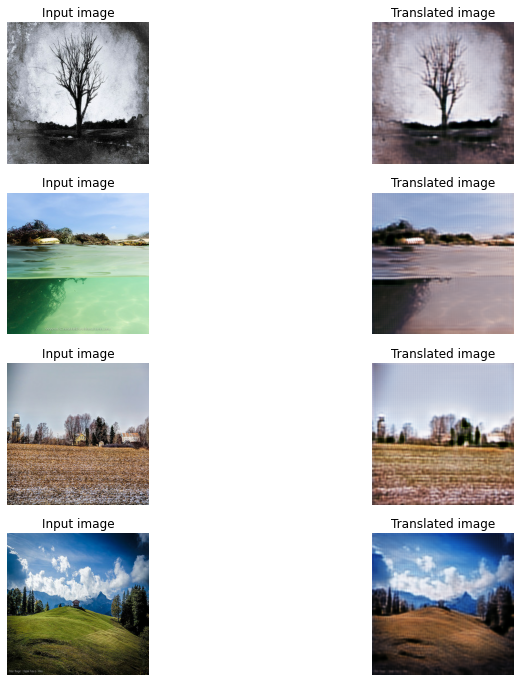

Epoch 12/20
1072/1072 [==============================] - 654s 610ms/step - G_loss: 1.7129 - F_loss: 1.8710 - D_X_loss: 0.4303 - D_Y_loss: 0.2255


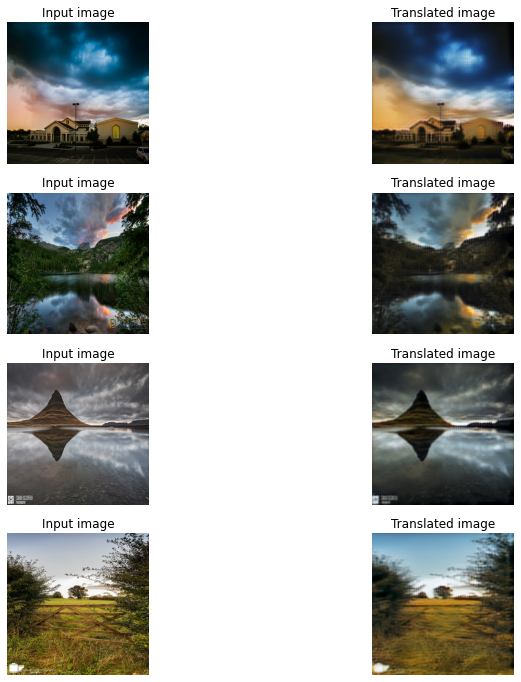

Epoch 13/20
1072/1072 [==============================] - 654s 610ms/step - G_loss: 1.6931 - F_loss: 1.6379 - D_X_loss: 0.2444 - D_Y_loss: 0.2242


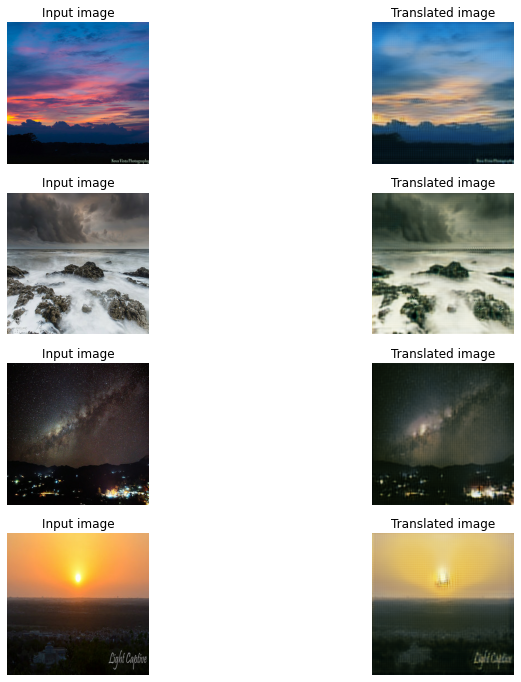

Epoch 14/20
1072/1072 [==============================] - 654s 610ms/step - G_loss: 1.6858 - F_loss: 1.6133 - D_X_loss: 0.2448 - D_Y_loss: 0.2266


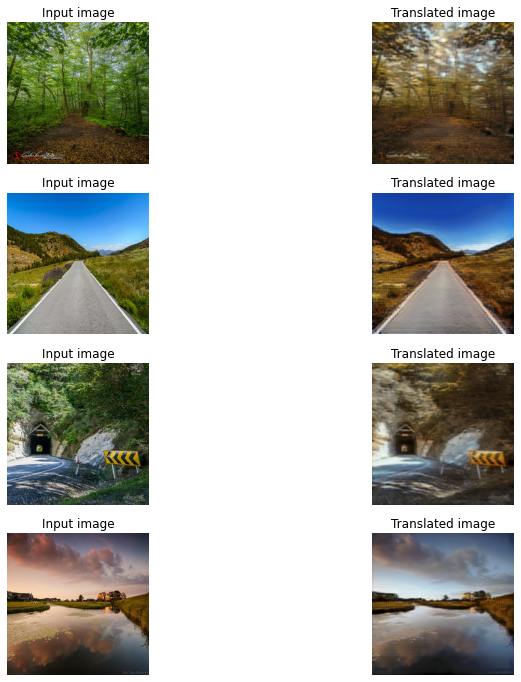

Epoch 15/20
1072/1072 [==============================] - 654s 609ms/step - G_loss: 1.6948 - F_loss: 1.6117 - D_X_loss: 0.2442 - D_Y_loss: 0.2252


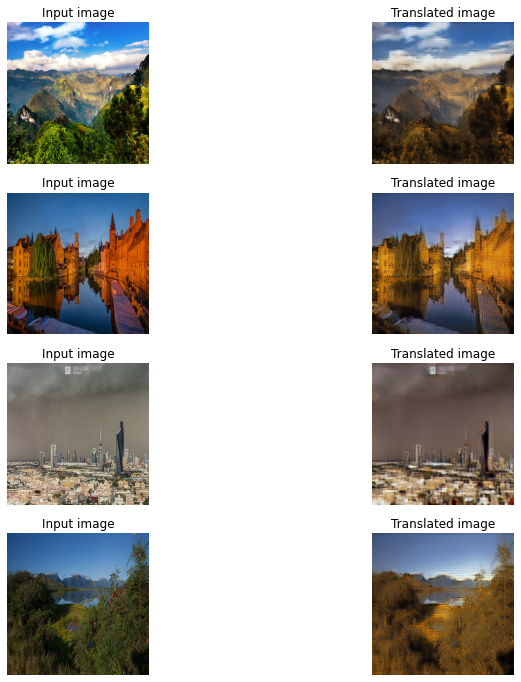

Epoch 16/20
1072/1072 [==============================] - 654s 609ms/step - G_loss: 1.6738 - F_loss: 1.5870 - D_X_loss: 0.2438 - D_Y_loss: 0.2297


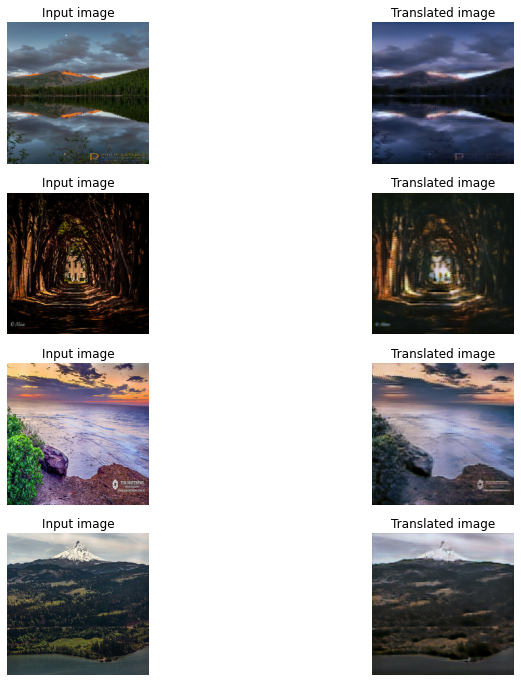

Epoch 17/20
1072/1072 [==============================] - 654s 609ms/step - G_loss: 1.6702 - F_loss: 1.5714 - D_X_loss: 0.2435 - D_Y_loss: 0.2287


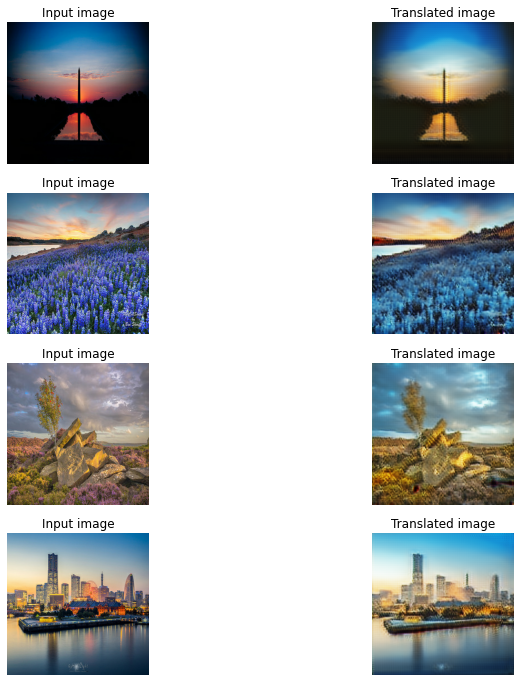

Epoch 18/20
1072/1072 [==============================] - 653s 609ms/step - G_loss: 1.6645 - F_loss: 1.5644 - D_X_loss: 0.2417 - D_Y_loss: 0.2297


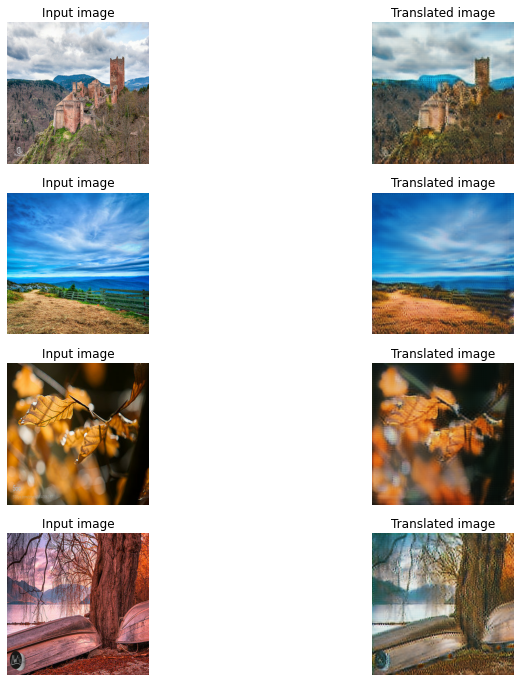

Epoch 19/20
1072/1072 [==============================] - 653s 609ms/step - G_loss: 1.8635 - F_loss: 1.5734 - D_X_loss: 0.2434 - D_Y_loss: 0.4747


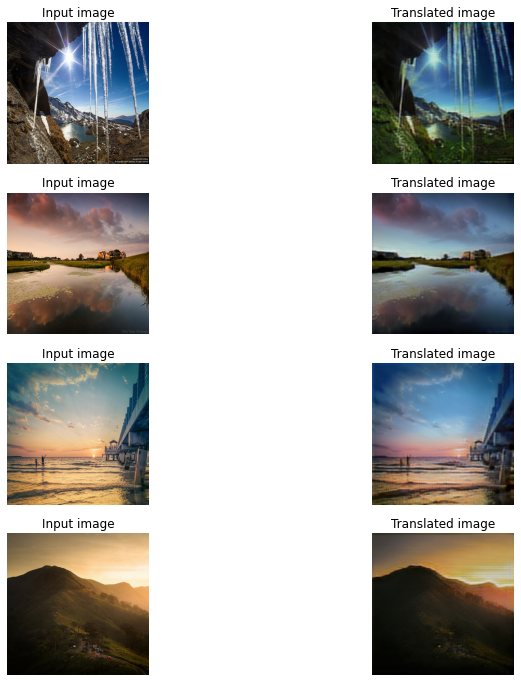

Epoch 20/20
1072/1072 [==============================] - 653s 609ms/step - G_loss: 1.5854 - F_loss: 1.5573 - D_X_loss: 0.2421 - D_Y_loss: 0.2420


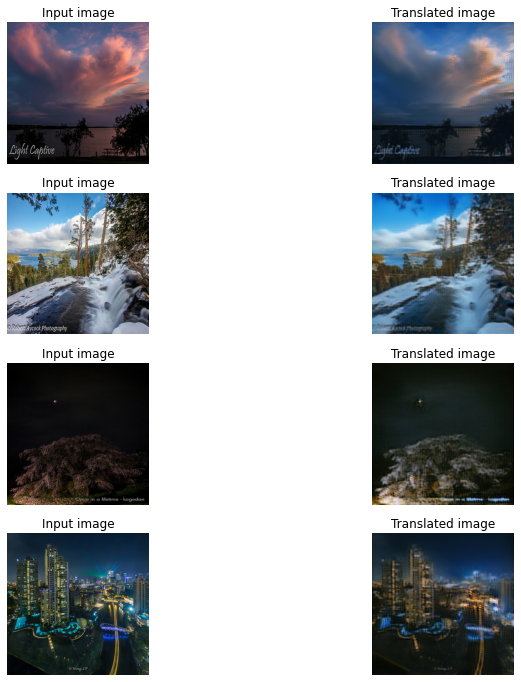

In [ ]:
# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
history1 = cycle_gan_model.fit(
    tf.data.Dataset.zip((train_monet, train_photo)),
    epochs=20,
    callbacks=[plotter, model_checkpoint_callback],
)

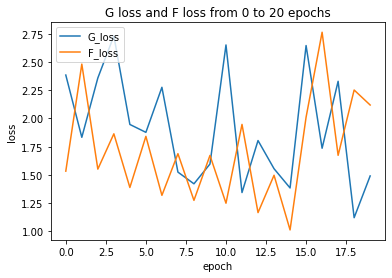

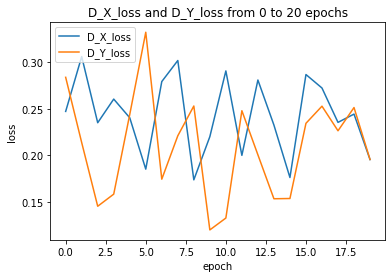

In [ ]:
plt.plot(history1.history['G_loss'])
plt.plot(history1.history['F_loss'])
plt.title('G loss and F loss from 0 to 20 epochs')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['G_loss', 'F_loss'], loc='upper left')
plt.savefig('/content/drive/MyDrive/CycleGAN/G_Loss_and_F_loss_0_20_epochs.png')
plt.show()
# summarize history for loss
plt.plot(history1.history['D_X_loss'])
plt.plot(history1.history['D_Y_loss'])
plt.title('D_X_loss and D_Y_loss from 0 to 20 epochs')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['D_X_loss', 'D_Y_loss'], loc='upper left')
plt.savefig('/content/drive/MyDrive/CycleGAN/D_X_loss_and_D_Y_loss_0_20_epochs.png')
plt.show()

In [ ]:
# Train 20-40 epochs

# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y, lambda_cycle=5
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=4e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=4e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=4e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=4e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "/content/drive/MyDrive/CycleGAN/pre-trained/cyclegan_monet2photo_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath
)


Weights loaded successfully


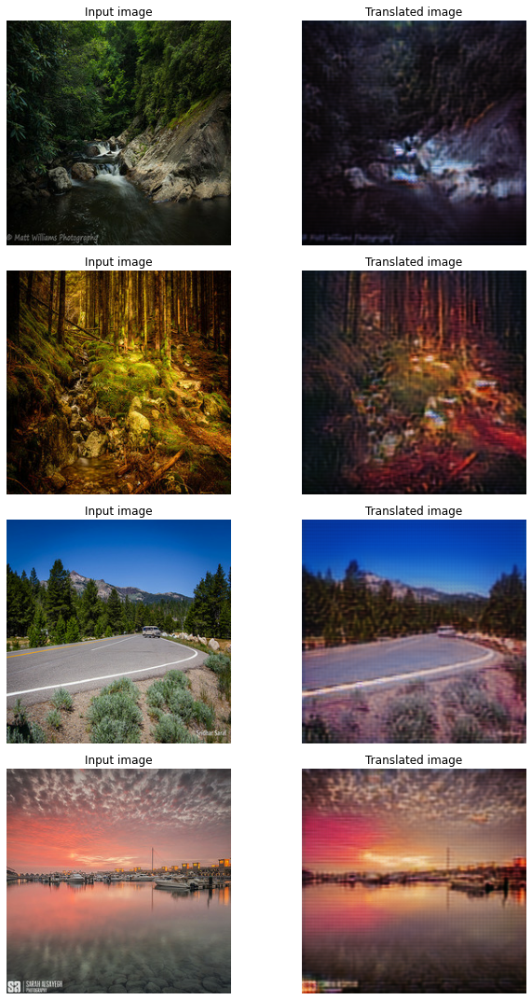

In [ ]:
# Load the checkpoints
weight_file = "/content/drive/MyDrive/CycleGAN/pre-trained/cyclegan_monet2photo_checkpoints.000"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_photo.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("/content/drive/MyDrive/CycleGAN/photo/predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

Epoch 1/20
1072/1072 [==============================] - 726s 632ms/step - G_loss: 1.6278 - F_loss: 1.4636 - D_X_loss: 0.2483 - D_Y_loss: 0.2343


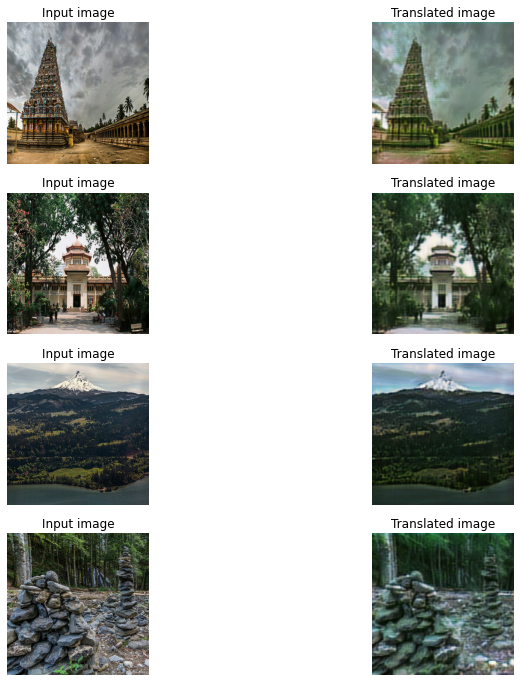

Epoch 2/20
1072/1072 [==============================] - 678s 632ms/step - G_loss: 1.6300 - F_loss: 1.4575 - D_X_loss: 0.2486 - D_Y_loss: 0.2337


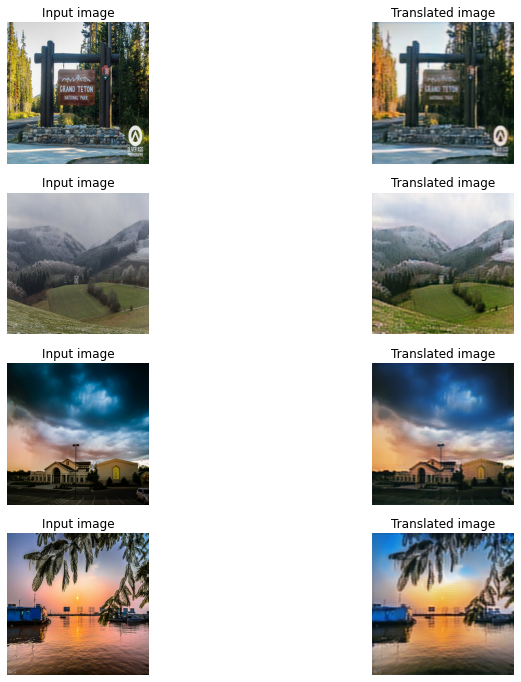

Epoch 3/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.6220 - F_loss: 1.4583 - D_X_loss: 0.2485 - D_Y_loss: 0.2331


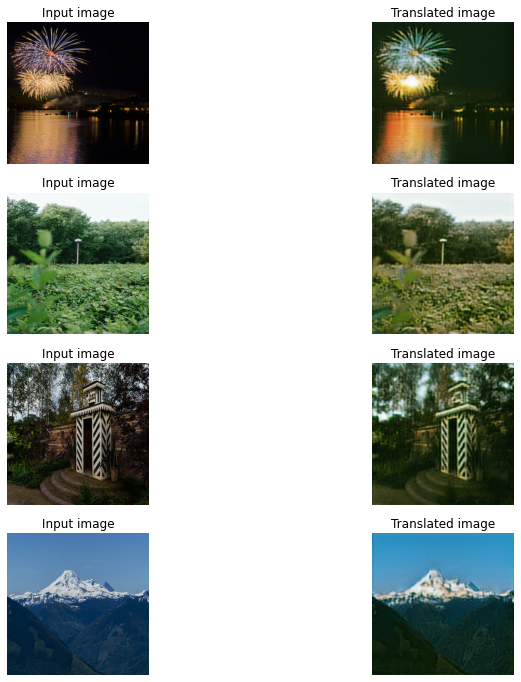

Epoch 4/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.6552 - F_loss: 1.4490 - D_X_loss: 0.2493 - D_Y_loss: 0.2301


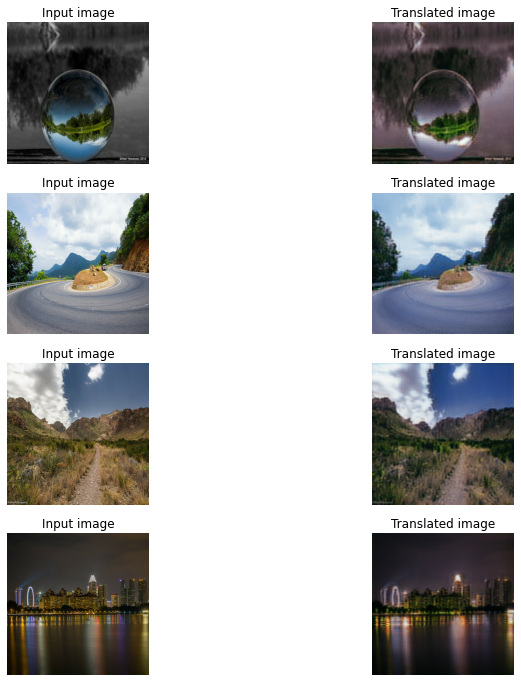

Epoch 5/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.6022 - F_loss: 1.5929 - D_X_loss: 0.4061 - D_Y_loss: 0.2312


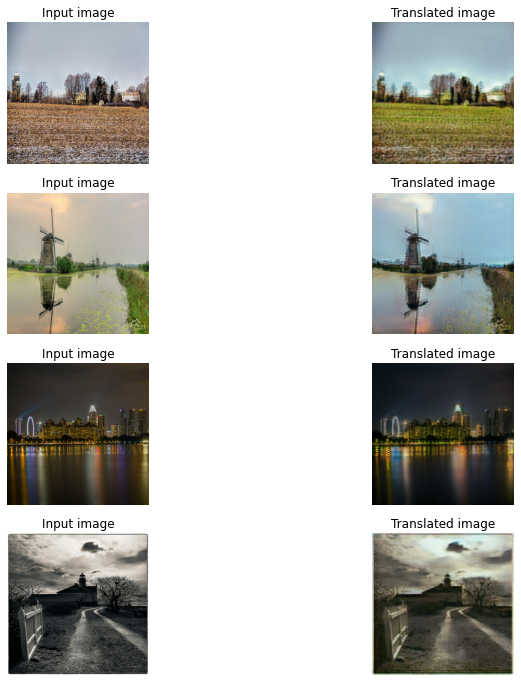

Epoch 6/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.6193 - F_loss: 1.4394 - D_X_loss: 0.2495 - D_Y_loss: 0.2328


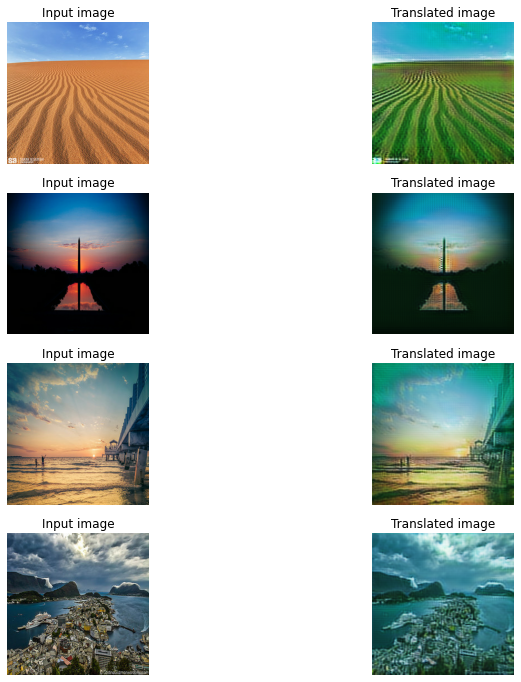

Epoch 7/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.6054 - F_loss: 1.4249 - D_X_loss: 0.2498 - D_Y_loss: 0.2307


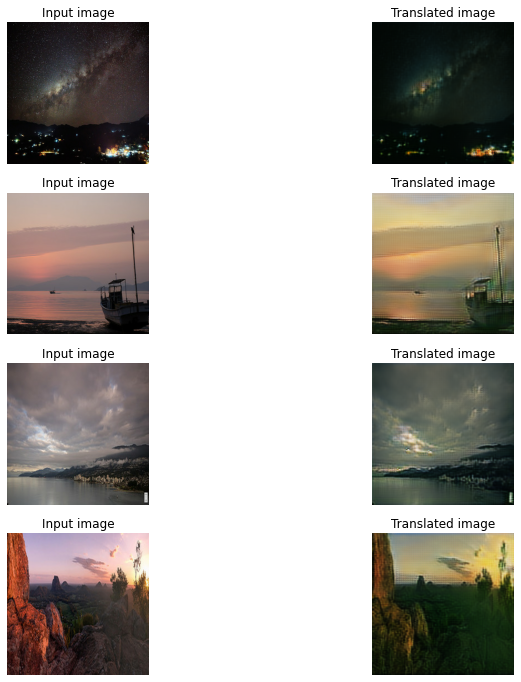

Epoch 8/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.7374 - F_loss: 1.4250 - D_X_loss: 0.2489 - D_Y_loss: 0.4511


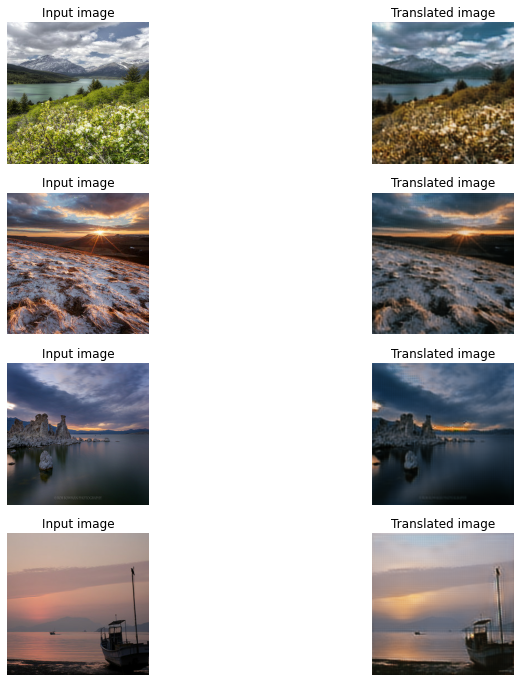

Epoch 9/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.5801 - F_loss: 1.4169 - D_X_loss: 0.2493 - D_Y_loss: 0.2388


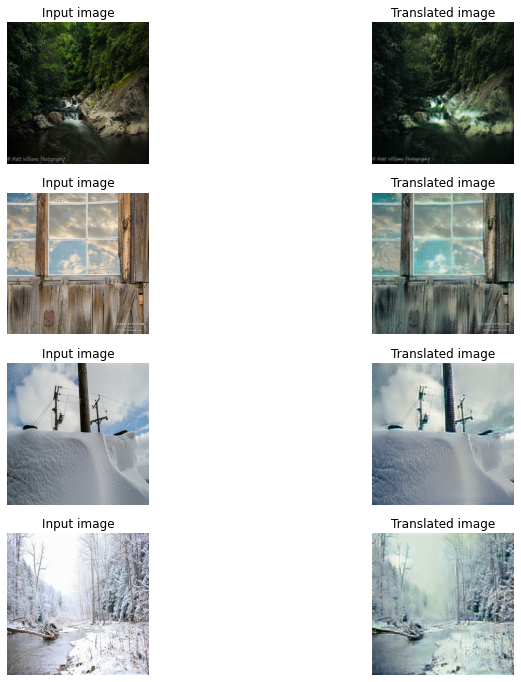

Epoch 10/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.5916 - F_loss: 1.3889 - D_X_loss: 0.2488 - D_Y_loss: 0.2350


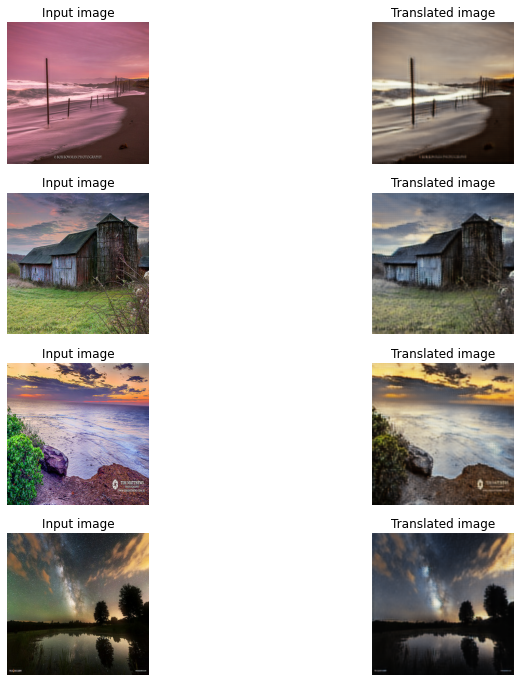

Epoch 11/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.5773 - F_loss: 1.3937 - D_X_loss: 0.2488 - D_Y_loss: 0.2316


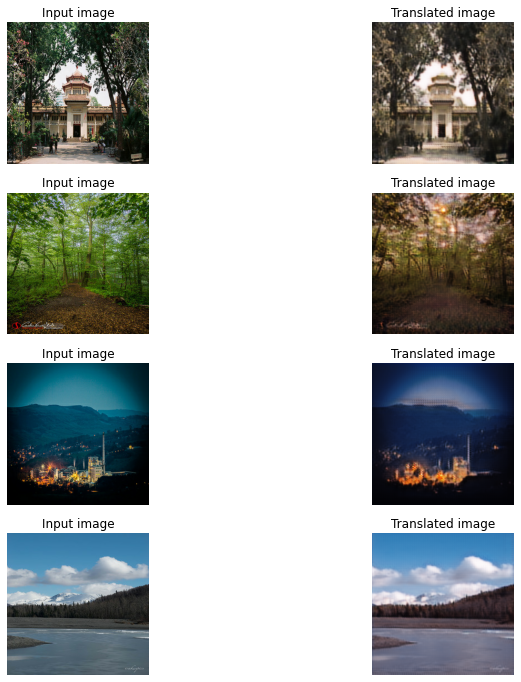

Epoch 12/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.5789 - F_loss: 1.3973 - D_X_loss: 0.2488 - D_Y_loss: 0.2299


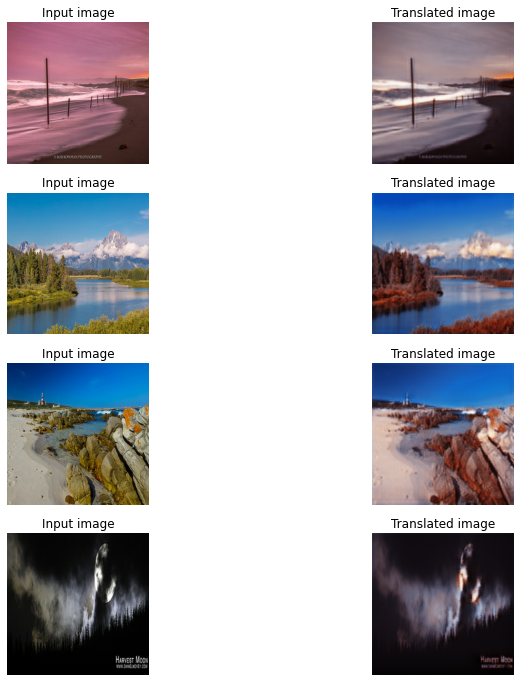

Epoch 13/20
1072/1072 [==============================] - 676s 630ms/step - G_loss: 1.5808 - F_loss: 1.3869 - D_X_loss: 0.2489 - D_Y_loss: 0.2286


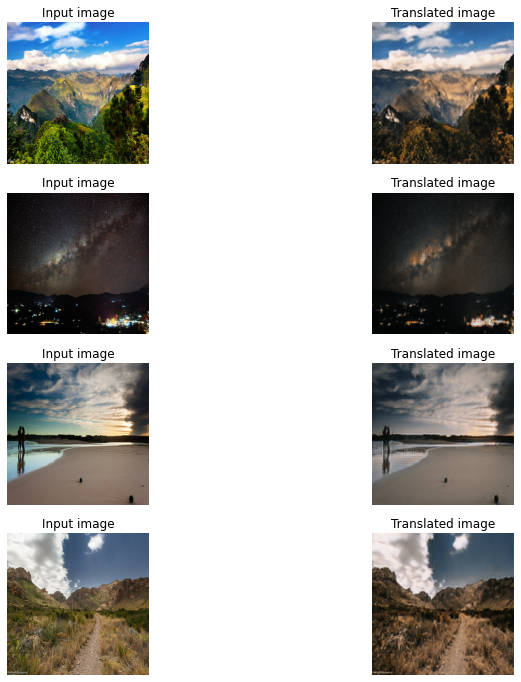

Epoch 14/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.5400 - F_loss: 1.6986 - D_X_loss: 0.5950 - D_Y_loss: 0.2314


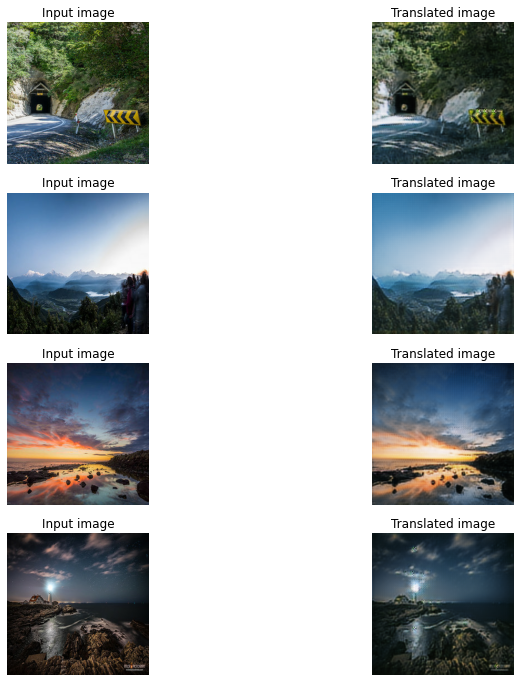

Epoch 15/20
1072/1072 [==============================] - 677s 631ms/step - G_loss: 1.5303 - F_loss: 1.3542 - D_X_loss: 0.2490 - D_Y_loss: 0.2308


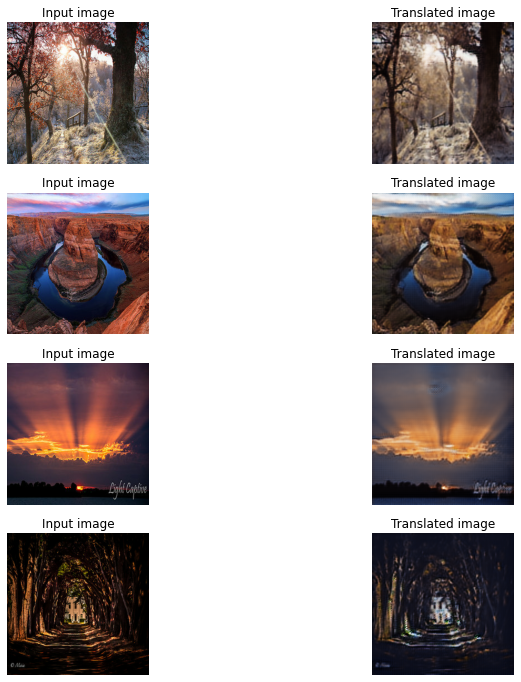

Epoch 16/20
1072/1072 [==============================] - 678s 632ms/step - G_loss: 1.5431 - F_loss: 1.3407 - D_X_loss: 0.2504 - D_Y_loss: 0.2287


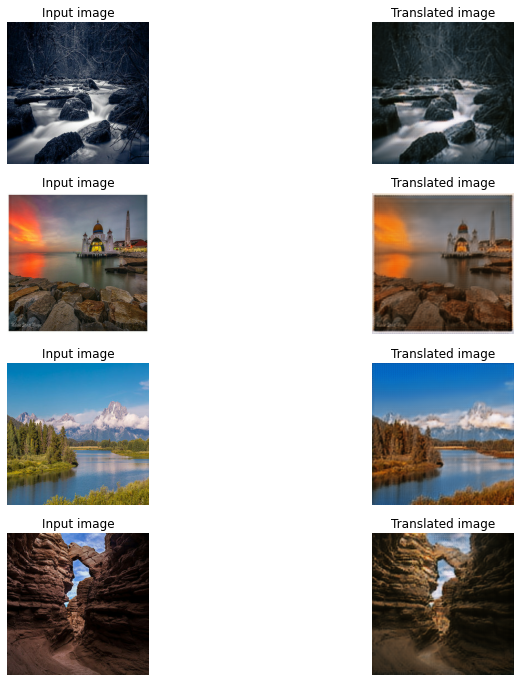

Epoch 17/20
1072/1072 [==============================] - 678s 632ms/step - G_loss: 1.5557 - F_loss: 1.3357 - D_X_loss: 0.2504 - D_Y_loss: 0.2277


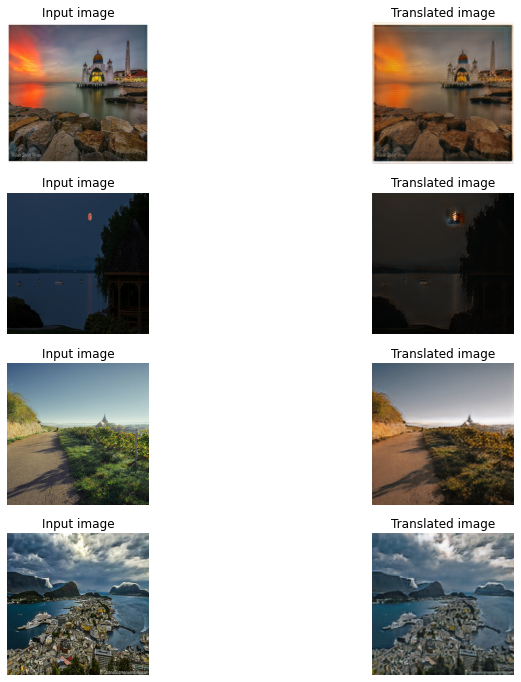

Epoch 18/20
1072/1072 [==============================] - 679s 632ms/step - G_loss: 1.7203 - F_loss: 1.3227 - D_X_loss: 0.2503 - D_Y_loss: 0.4395


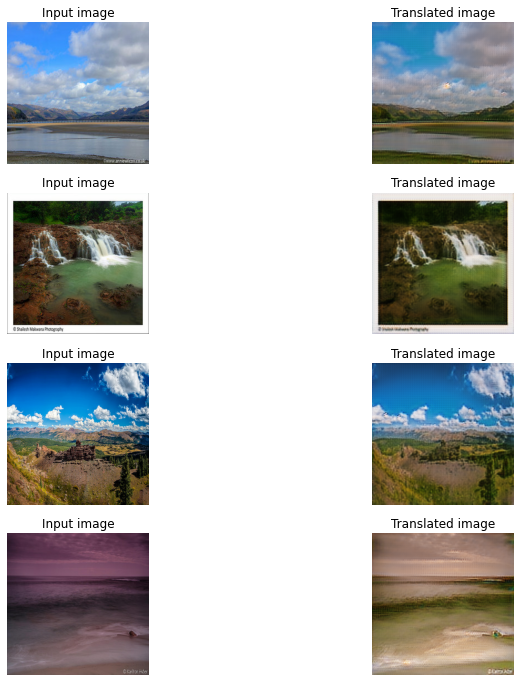

Epoch 19/20
1072/1072 [==============================] - 678s 632ms/step - G_loss: 1.5342 - F_loss: 1.3070 - D_X_loss: 0.2498 - D_Y_loss: 0.2377


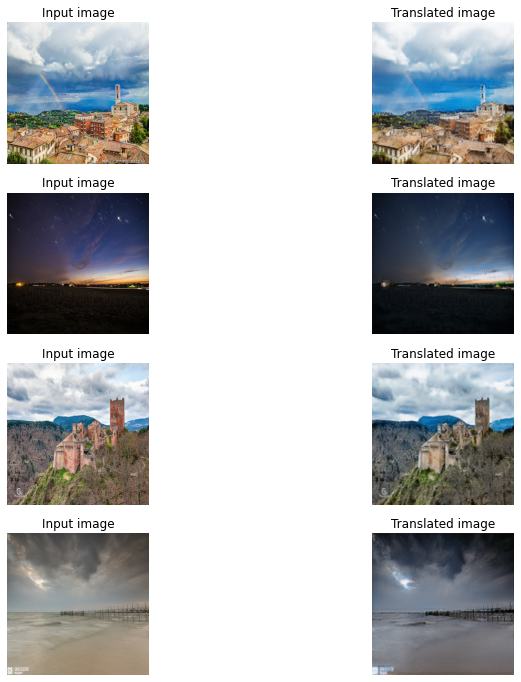

Epoch 20/20
1072/1072 [==============================] - 679s 633ms/step - G_loss: 1.5697 - F_loss: 1.3207 - D_X_loss: 0.2476 - D_Y_loss: 0.2339


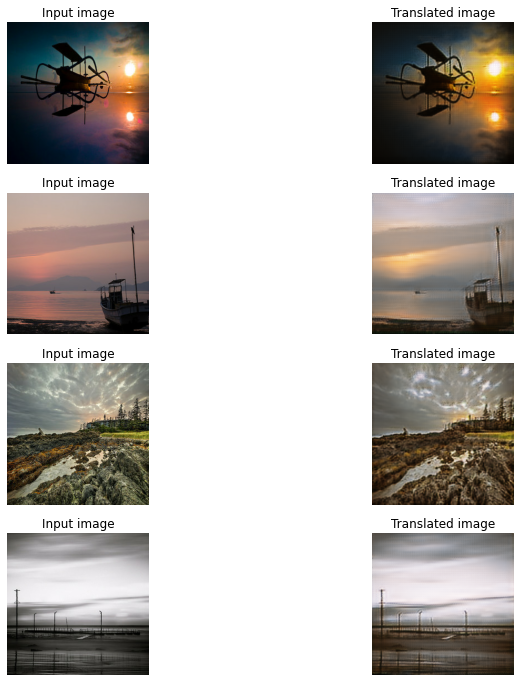

In [ ]:
# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((train_monet, train_photo)),
    epochs=20,
    callbacks=[plotter, model_checkpoint_callback],
)

Weights loaded successfully


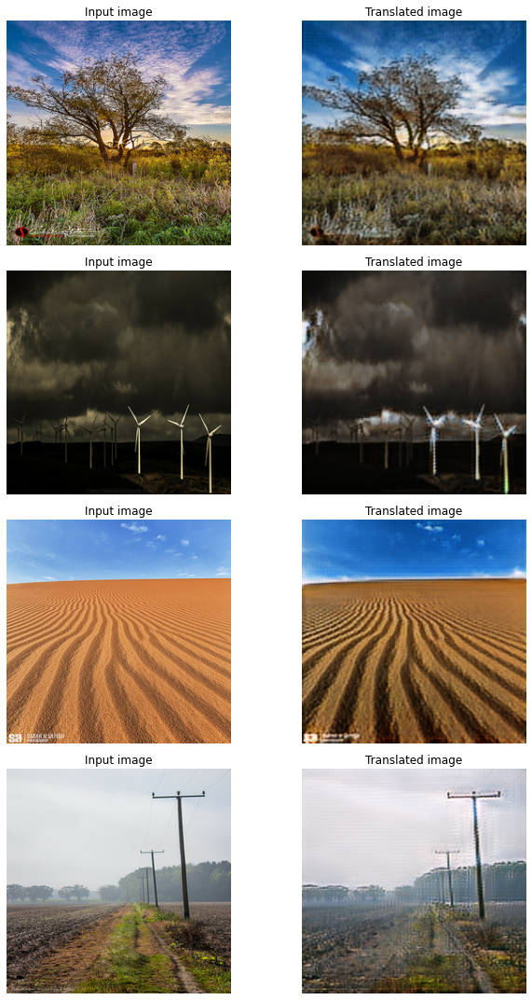

In [ ]:
# Load the checkpoints
weight_file = "/content/drive/MyDrive/CycleGAN/pre-trained/cyclegan_monet2photo_checkpoints.020"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_photo.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("/content/drive/MyDrive/CycleGAN/photo/predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

In [ ]:
history.history.keys()

dict_keys(['G_loss', 'F_loss', 'D_X_loss', 'D_Y_loss'])

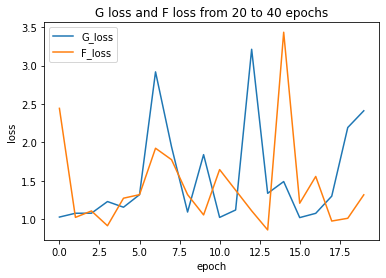

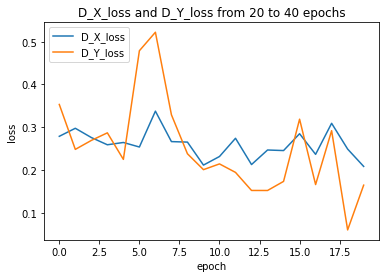

In [ ]:
plt.plot(history2.history['G_loss'])
plt.plot(history2.history['F_loss'])
plt.title('G loss and F loss from 20 to 40 epochs')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['G_loss', 'F_loss'], loc='upper left')
plt.savefig('/content/drive/MyDrive/CycleGAN/G_Loss_and_F_loss_20_40_epochs.png')
plt.show()
# summarize history for loss
plt.plot(history2.history['D_X_loss'])
plt.plot(history2.history['D_Y_loss'])
plt.title('D_X_loss and D_Y_loss from 20 to 40 epochs')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['D_X_loss', 'D_Y_loss'], loc='upper left')
plt.savefig('/content/drive/MyDrive/CycleGAN/D_X_loss_and_D_Y_loss_20_40_epochs.png')
plt.show()

In [ ]:
len(history.history['G_loss'])

20

In [ ]:
history2 = history